In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import shap
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import image_dataset_from_directory
import os
from keras.utils import load_img, img_to_array
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans

In [2]:
# Step 1: Load and preprocess the image dataset with higher resolution
data = image_dataset_from_directory(
    'flowers',
    image_size=(256, 256),
    batch_size=32
)

# Normalize images and prepare labels
images, labels = [], []
for image_batch, label_batch in data:
    images.append(image_batch.numpy())
    labels.append(label_batch.numpy())

images = np.concatenate(images) / 255.0
labels = np.concatenate(labels)

# Filter to include only 'rose' and 'sunflower' classes
mask = labels < 2
images, labels = images[mask], labels[mask]


Found 1517 files belonging to 2 classes.


In [3]:
# Step 2: Train a CNN model to output only 2 classes (rose, sunflower)
inputs = Input(shape=(256, 256, 3), name="Input")
x = Conv2D(32, 3, activation="relu", padding='same', name='Conv1')(inputs)
x = MaxPooling2D(2, name='Pool1')(x)
x = Conv2D(16, 3, activation="relu", padding='same', name='Conv2')(x)
x = MaxPooling2D(2, name='Pool2')(x)
x = Flatten(name='Vectorize')(x)
x = Dense(128, activation="relu", name="Dense1")(x)  # Embedding layer
x = Dense(2, name='FC')(x)  # Output only 2 classes now
outputs = Activation("softmax", name='Softmax')(x)

# Compile the CNN model
cnn_model = Model(inputs, outputs)
cnn_model.compile(optimizer=Adam(learning_rate=0.001), loss=CategoricalCrossentropy(), metrics=['acc'])

# Train the CNN
X_train, X_test, y_train, y_test = train_test_split(images, labels, stratify=labels, test_size=0.2, random_state=11)
cnn_model.fit(
    X_train,
    to_categorical(y_train, num_classes=2),
    validation_split=0.15,
    batch_size=32,
    epochs=5  # Keep epochs low for quicker training
)

Epoch 1/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - acc: 0.6333 - loss: 2.0682 - val_acc: 0.8736 - val_loss: 0.3495
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 267ms/step - acc: 0.8706 - loss: 0.3094 - val_acc: 0.8462 - val_loss: 0.4630
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 269ms/step - acc: 0.8828 - loss: 0.2939 - val_acc: 0.8956 - val_loss: 0.3631
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 266ms/step - acc: 0.9285 - loss: 0.1866 - val_acc: 0.9011 - val_loss: 0.2997
Epoch 5/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - acc: 0.9630 - loss: 0.0871 - val_acc: 0.9121 - val_loss: 0.3374


In [4]:
#Extract embeddings from the CNN
def extract_embeddings(cnn_model, images):
    feature_extractor = Model(inputs=cnn_model.input, outputs=cnn_model.get_layer("Dense1").output)
    return feature_extractor.predict(images)

X_train_embed = extract_embeddings(cnn_model, X_train)
X_test_embed = extract_embeddings(cnn_model, X_test)

# Train an XGBoost classifier on the embeddings
xgb_model = XGBClassifier(eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train_embed, y_train)

38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:36, 36.27s/it]               


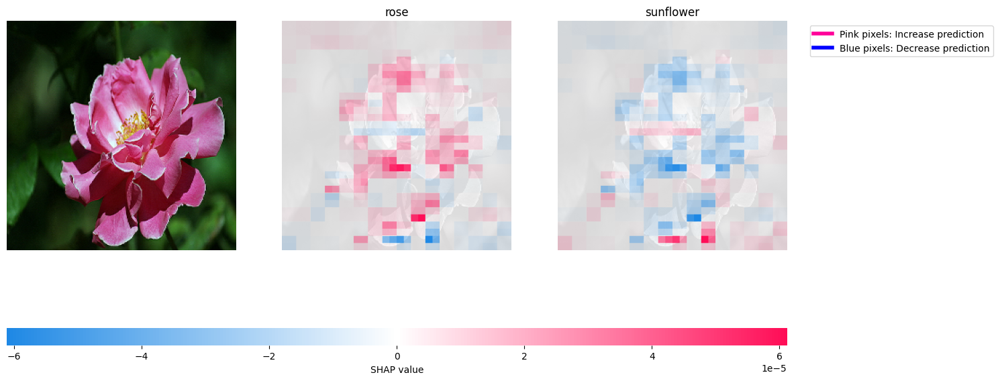

In [5]:
# SHAP Explainer
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test_embed)

# SHAP Image Masker
def f(x):
    tmp = x.copy()
    return cnn_model(tmp)

masker_blur = shap.maskers.Image("blur(256,256)", X_test[0].shape)
explainer = shap.Explainer(f, masker_blur, output_names=['rose', 'sunflower'])

ind = [120]

shap_values_ = explainer(X_test[ind], max_evals=5000, batch_size=50)
# Plot SHAP values with custom legends
shap.image_plot(shap_values_, X_test[ind], labels=['rose', 'sunflower'], show=False)

legend_elements = [
    Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
    Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
]
plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
plt.gcf().set_size_inches(15, 10)
plt.show()

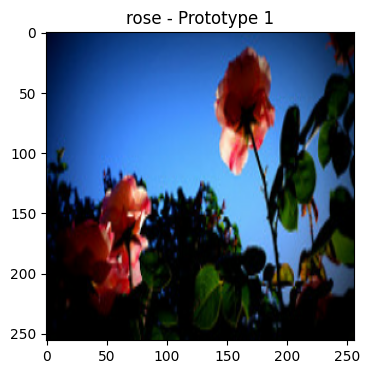

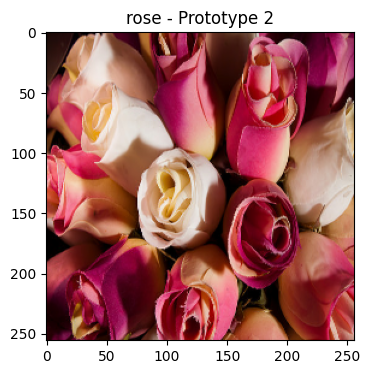

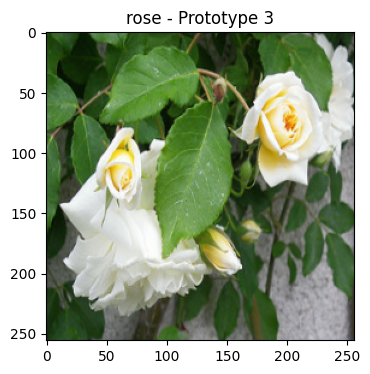

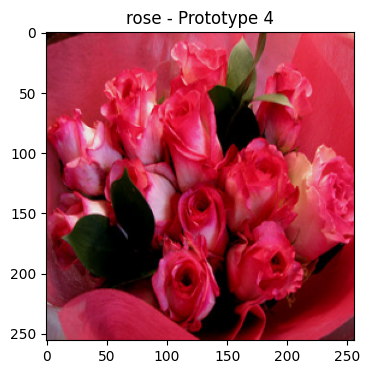

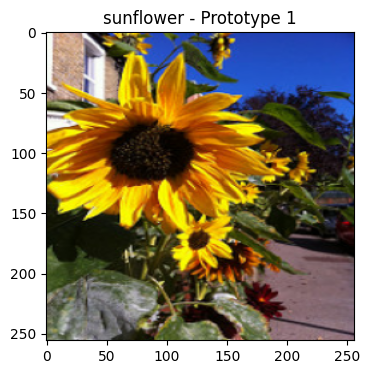

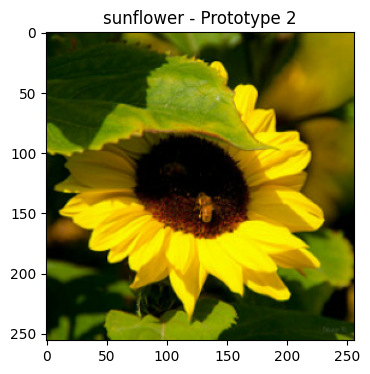

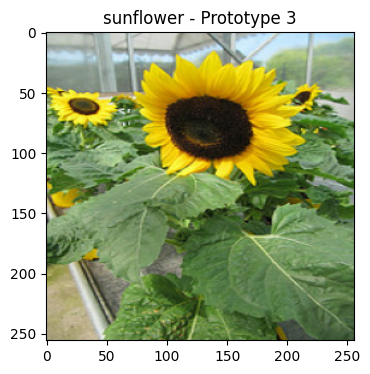

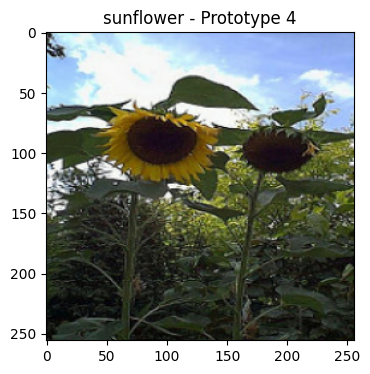

In [40]:
# Prototypes with K-means Clustering
def find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4):
    prototypes = []
    for class_label in np.unique(y_train):
        class_indices = np.where(y_train == class_label)[0]
        class_embeddings = X_train_embed[class_indices]
        
        kmeans = KMeans(n_clusters=n_prototypes, random_state=42).fit(class_embeddings)
        centroids = kmeans.cluster_centers_
        prototypes.append(centroids)
    
    return prototypes

prototypes = find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4)

# Visualize prototypes
def visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best'):
    for class_label, proto_centroids in enumerate(prototypes):
        for i, proto in enumerate(proto_centroids):
            distances = np.linalg.norm(X_test_embed - proto, axis=1)
            prototype_image_index = np.argmin(distances)
            
            plt.figure(figsize=(4, 4))
            plt.imshow(X_test[prototype_image_index])
            plt.title(f"{['rose', 'sunflower'][class_label]} - Prototype {i + 1}")
            plt.show()

visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:32, 32.48s/it]               


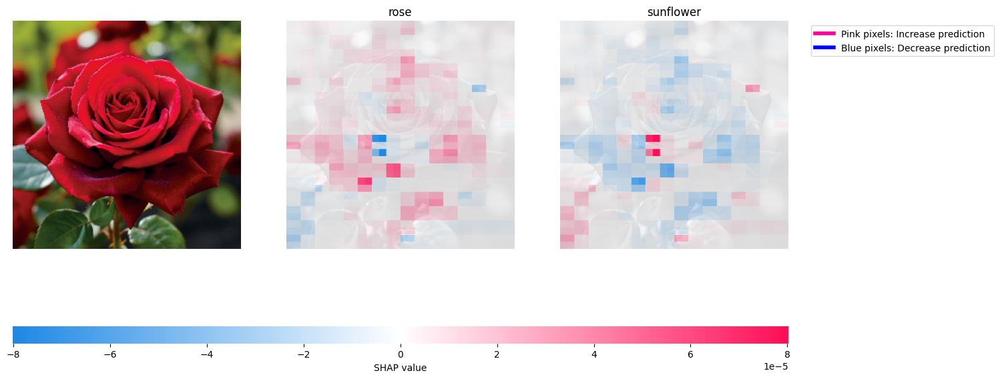

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:31, 31.70s/it]               


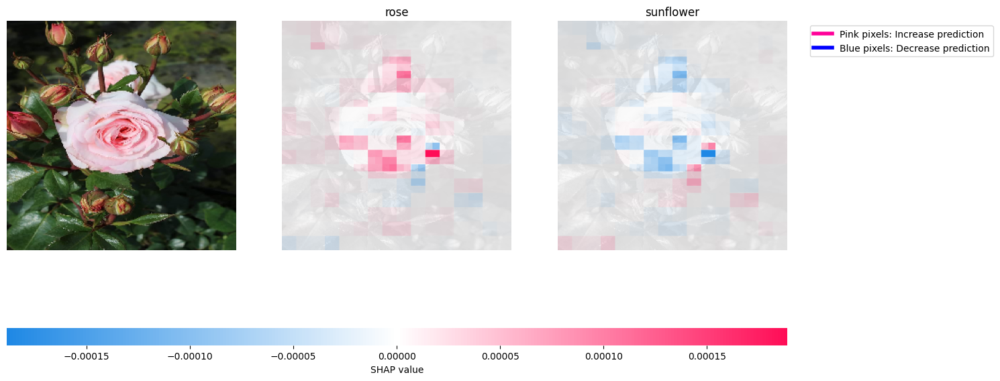

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:31, 31.03s/it]               


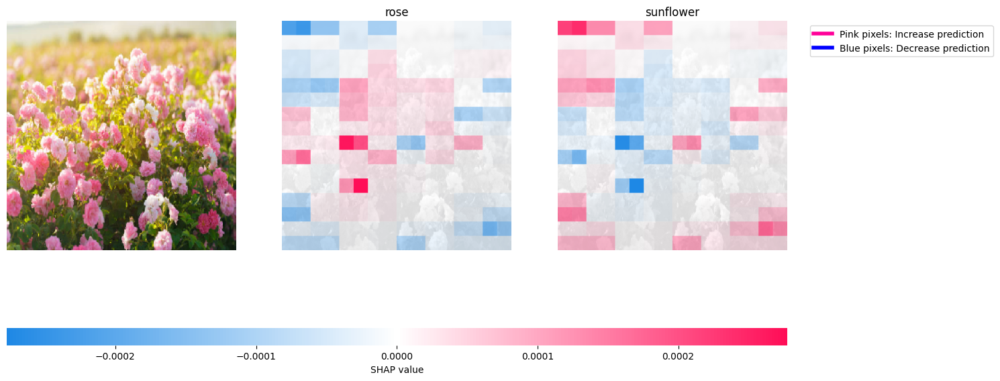

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:29, 29.98s/it]               


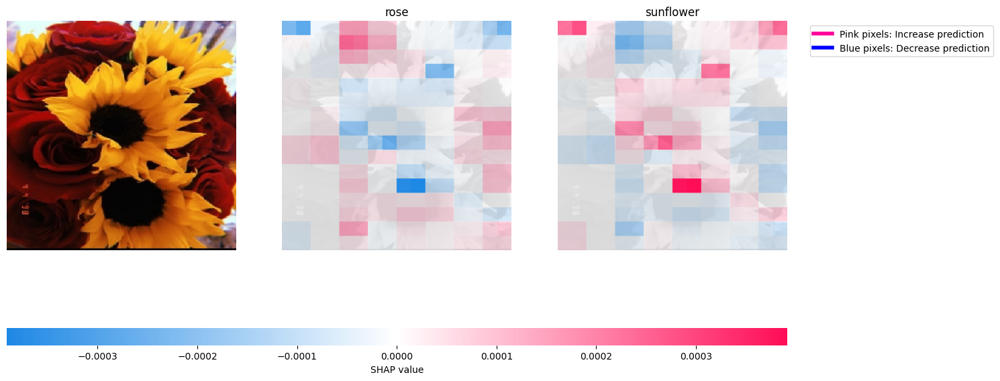

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:30, 30.56s/it]               


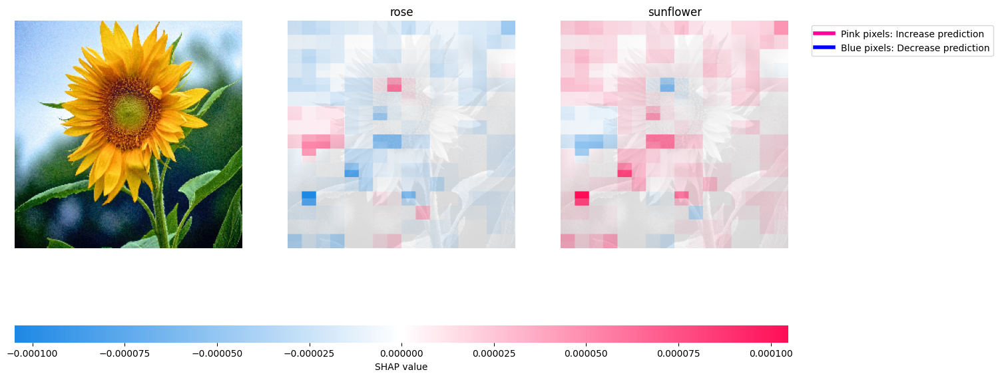

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:30, 30.20s/it]               


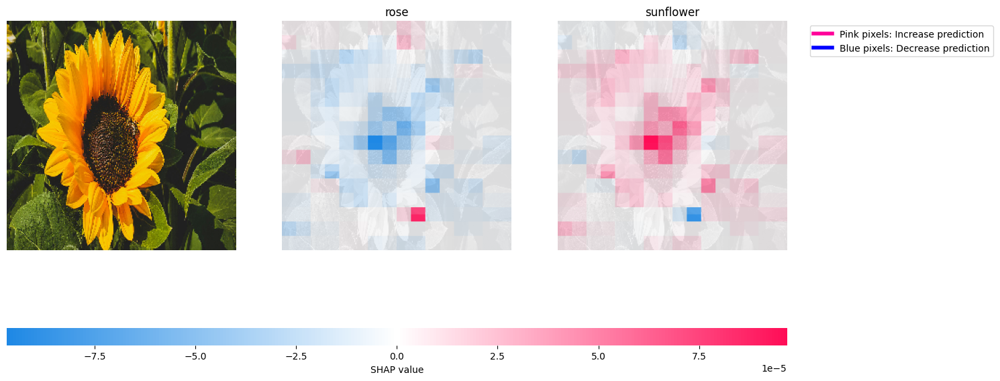

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:29, 29.98s/it]               


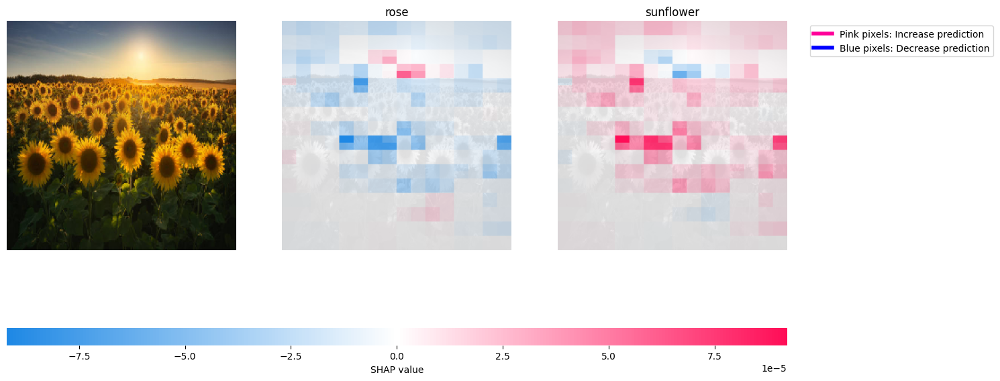

In [7]:
# Try SHAP and Prototypes with Additional Images
additional_images = []
for filename in os.listdir('test_images'):
    img = load_img(os.path.join('test_images', filename), target_size=(256, 256))
    img = img_to_array(img) / 255.0
    additional_images.append(img)

additional_images = np.array(additional_images)
additional_embeddings = extract_embeddings(cnn_model, additional_images)
additional_predictions = xgb_model.predict(additional_embeddings)

for i, image in enumerate(additional_images):
    shap_values_ = explainer(image[np.newaxis, ...], max_evals=5000, batch_size=50)
    shap.image_plot(shap_values_, image[np.newaxis, ...], labels=['rose', 'sunflower'], show=False)

    legend_elements = [
        Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
        Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
    ]

    plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
    plt.gcf().set_size_inches(15, 10)
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


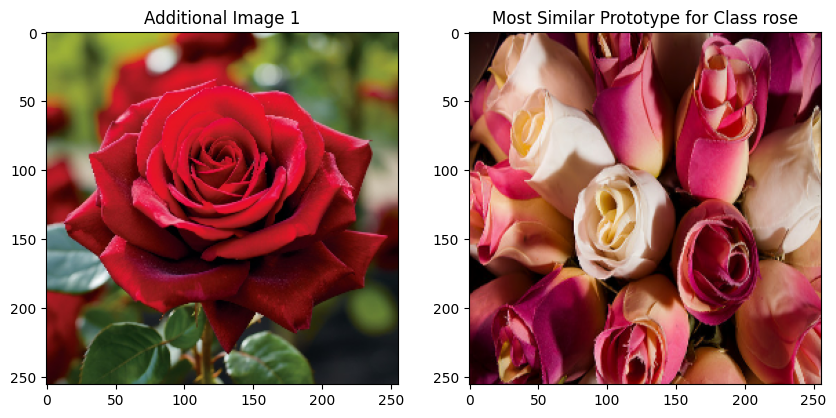

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


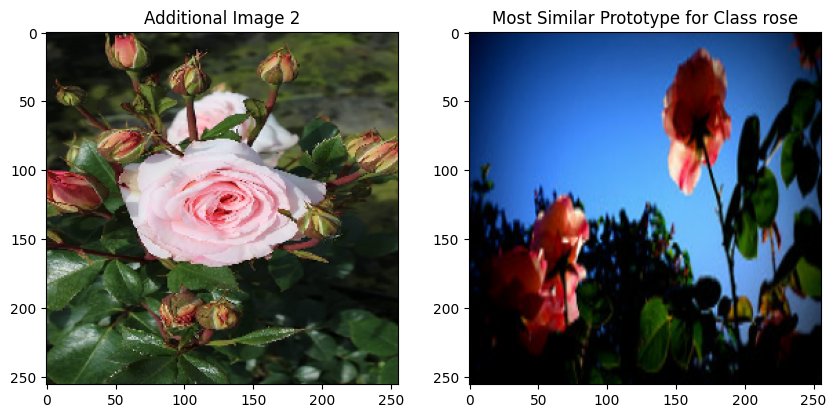

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


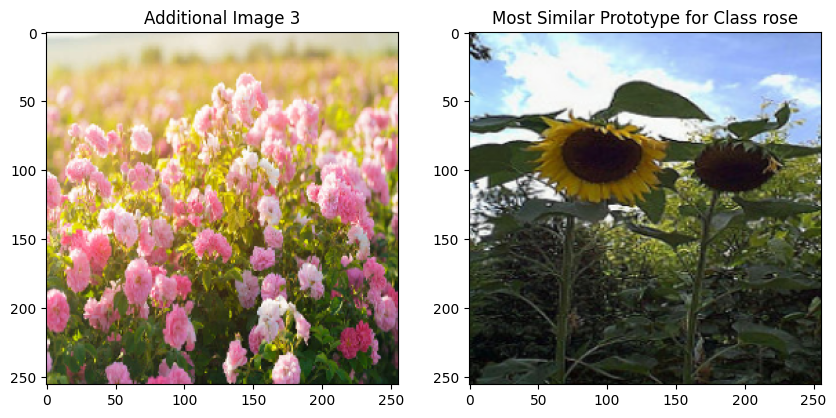

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


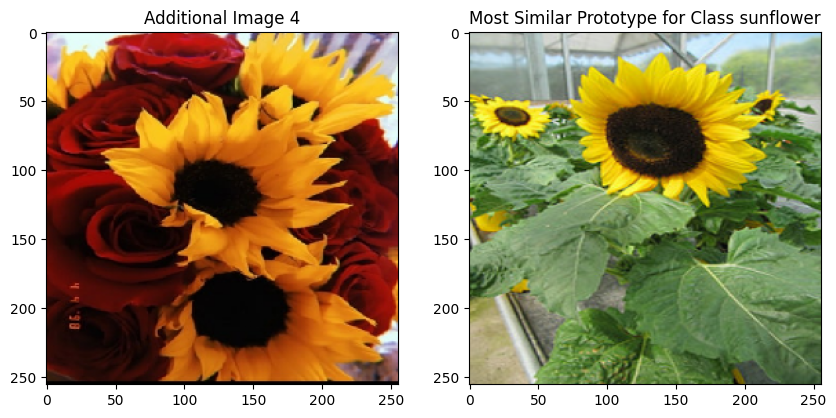

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


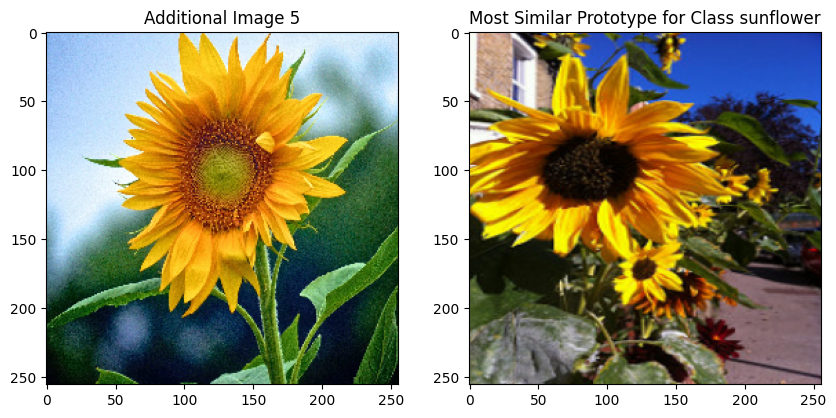

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


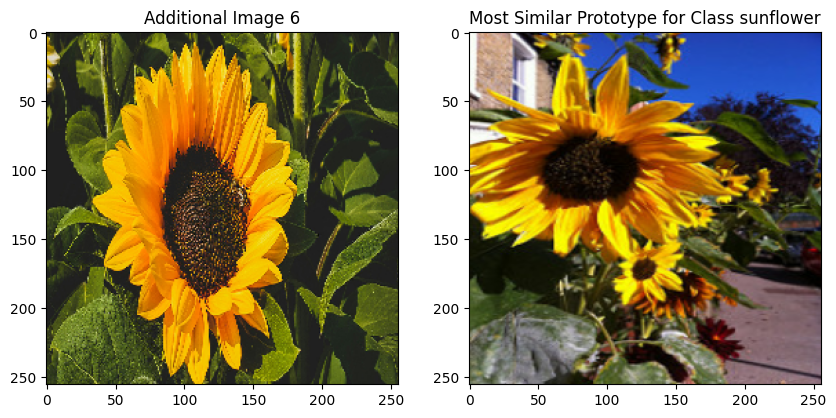

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


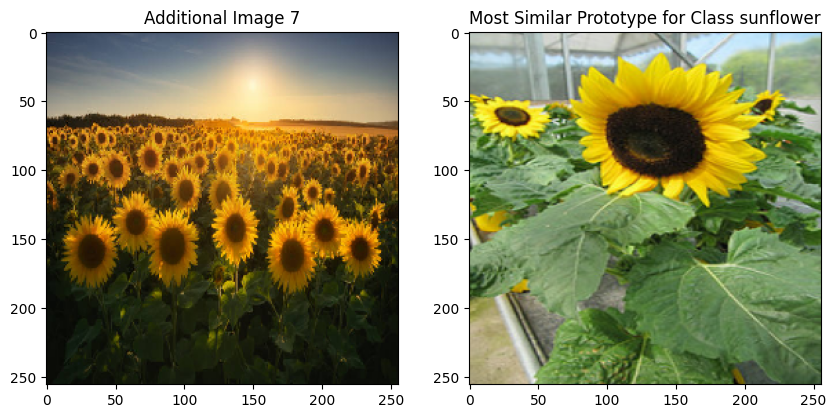

In [8]:
def match_prototypes(extra_embed, prototypes):
    min_distance = float('inf')
    closest_prototype = None
    for class_prototypes in prototypes:
        for proto in class_prototypes:
            distance = np.linalg.norm(extra_embed - proto)
            if distance < min_distance:
                min_distance = distance
                closest_prototype = proto
    return closest_prototype

for i, image in enumerate(additional_images):
    most_similar_prototype = match_prototypes(additional_embeddings[i], prototypes)

    predicted_class = np.argmax(cnn_model.predict(image[np.newaxis, ...]))
    class_name = ['rose', 'sunflower'][predicted_class]

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Additional Image {i + 1}")
    plt.subplot(1, 2, 2)
    plt.imshow(X_test[np.argmin(np.linalg.norm(X_test_embed - most_similar_prototype, axis=1))])
    plt.title(f"Most Similar Prototype for Class {class_name}")
    plt.show()

### Another Approach for Shap Images


In [45]:
def custom_feature_importance_visualization(model, image, explainer, class_names):
   
    predictions = model.predict(image[np.newaxis, ...], verbose=0)
    predicted_class = np.argmax(predictions)
    
   
    shap_values_ = explainer(image[np.newaxis, ...], max_evals=5000, batch_size=50)
    shap_array = shap_values_[0, :, :, :, predicted_class].values
    shap_array_norm = (shap_array - shap_array.min()) / (shap_array.max() - shap_array.min())
    
    importance_scores = np.abs(shap_array_norm).sum(axis=2)
    
    
    plt.figure(figsize=(8, 5))
    
   
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f'Image predicted as: \n{class_names[predicted_class]}', fontsize=16)
    plt.axis('off')
    
   
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    
    plt.imshow(importance_scores, alpha=0.6, cmap="BrBG")
    plt.title('Feature Importance', fontsize=16)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return predicted_class

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:32, 32.74s/it]               


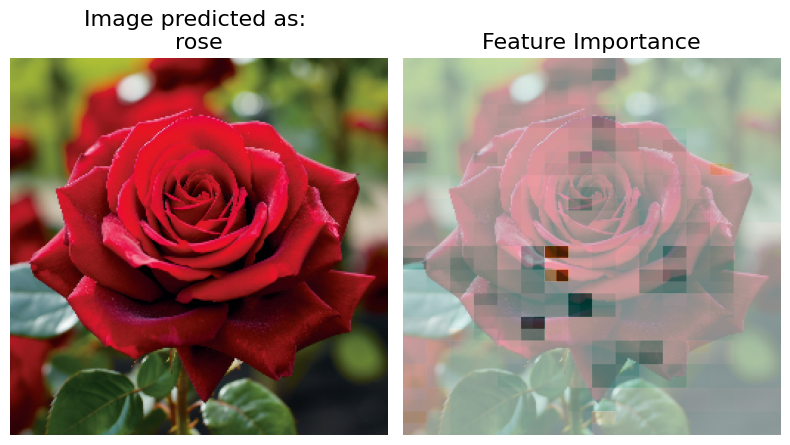

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:34, 34.58s/it]               


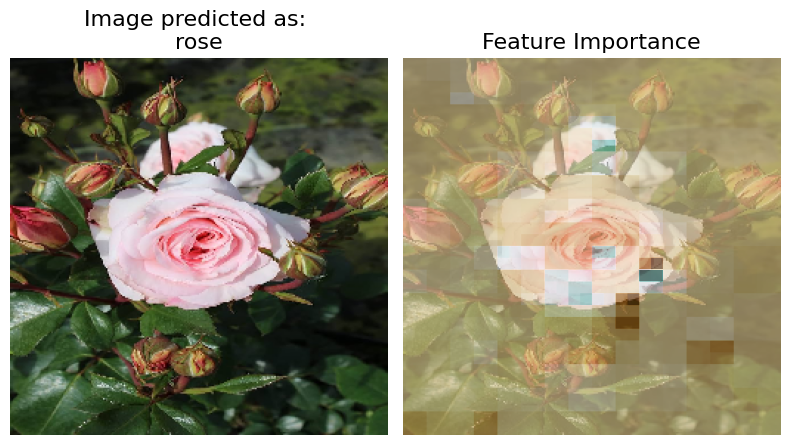

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:33, 33.73s/it]               


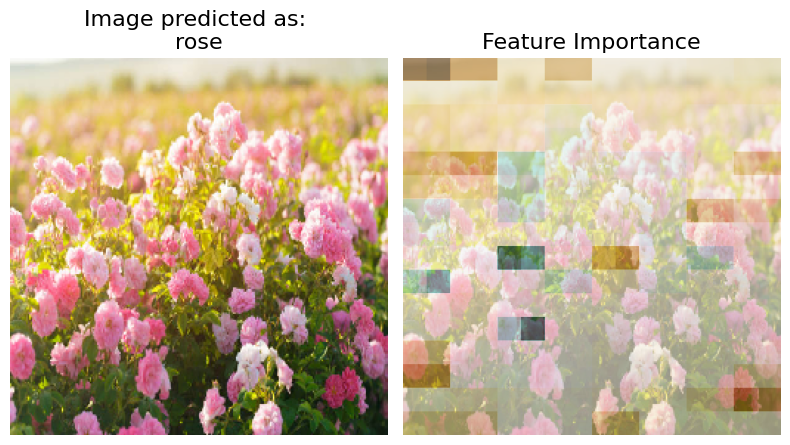

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:32, 32.80s/it]               


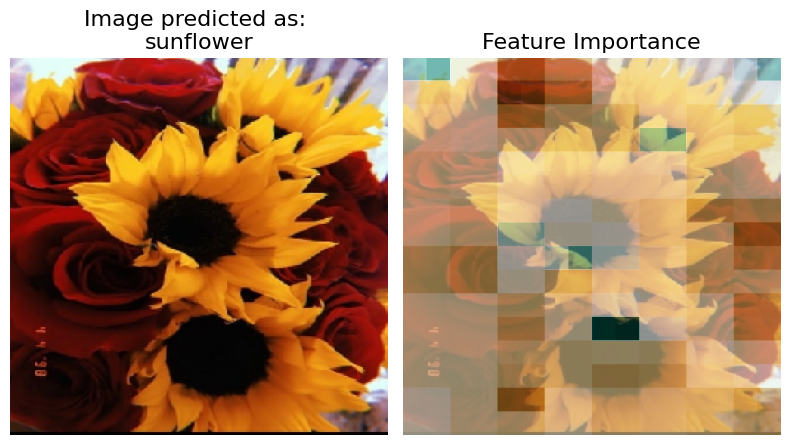

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:32, 32.51s/it]               


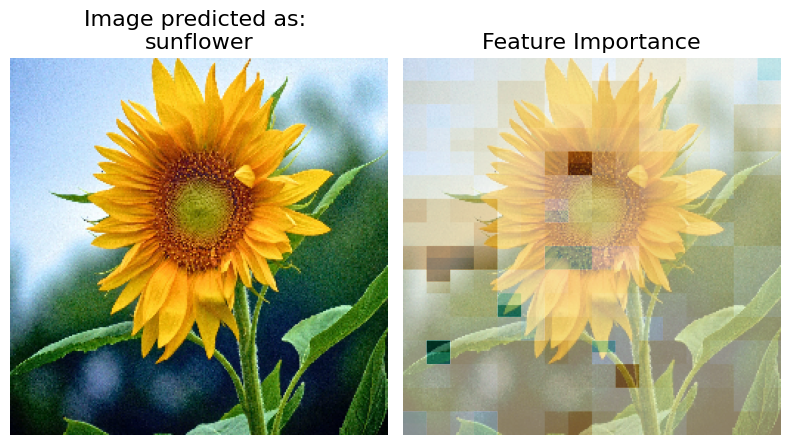

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:32, 32.37s/it]               


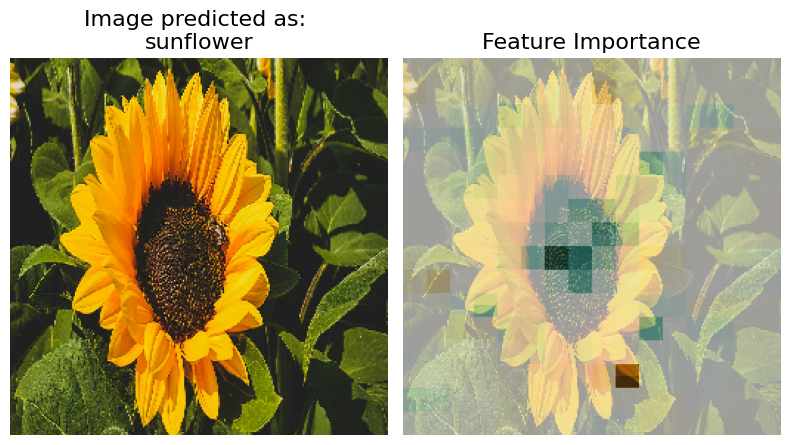

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:34, 34.05s/it]               


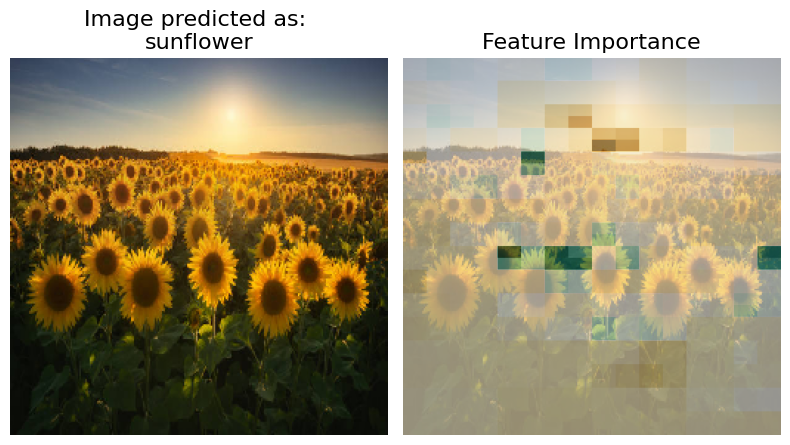

In [46]:
masker_blur = shap.maskers.Image("blur(256,256)", X_test[0].shape)
explainer = shap.Explainer(f, masker_blur, output_names=['rose', 'sunflower'])

class_names = ['rose', 'sunflower']


for image in additional_images:
    custom_feature_importance_visualization(cnn_model, image, explainer, class_names)

In [47]:
probs = xgb_model.predict_proba(X_test_embed)

# Calculate maximum probabilities for each sample
max_probs = np.max(probs, axis=1)  # Get the highest probability for each sample

# Define the threshold range around 50% (e.g., 45% to 55%)
lower_bound = 0.45
upper_bound = 0.55

# Get indices of samples with probabilities close to 50%
indices_near_50 = np.where((max_probs >= lower_bound) & (max_probs <= upper_bound))[0]

print("Indices of images with probabilities around 50%:", indices_near_50)

# Optionally, you can print additional info about these samples
for idx in indices_near_50:
    print(f"Index: {idx}, Probability: {max_probs[idx]:.2f}, Label: {y_test[idx]}, Predicted: {xgb_model.predict([X_test_embed[idx]])[0]}")

Indices of images with probabilities around 50%: [ 53 173]
Index: 53, Probability: 0.55, Label: 0, Predicted: 1
Index: 173, Probability: 0.53, Label: 1, Predicted: 1


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:32, 32.56s/it]               


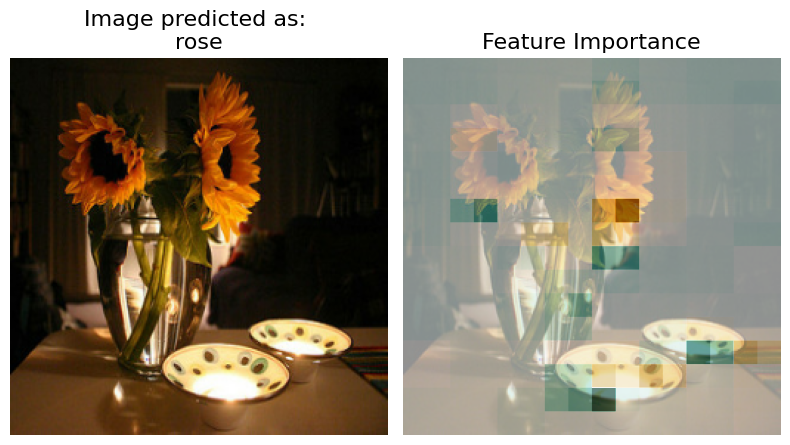

0

In [49]:
custom_feature_importance_visualization(cnn_model, X_test[173], explainer, class_names)

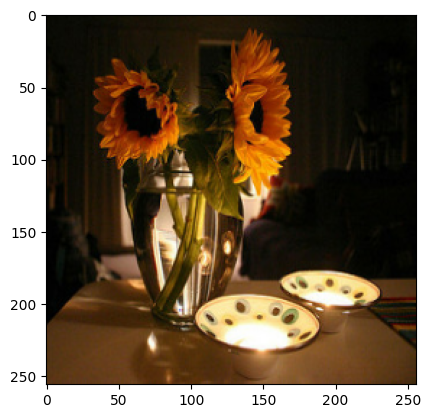

In [ ]:
plt.imshow(X_test[173])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


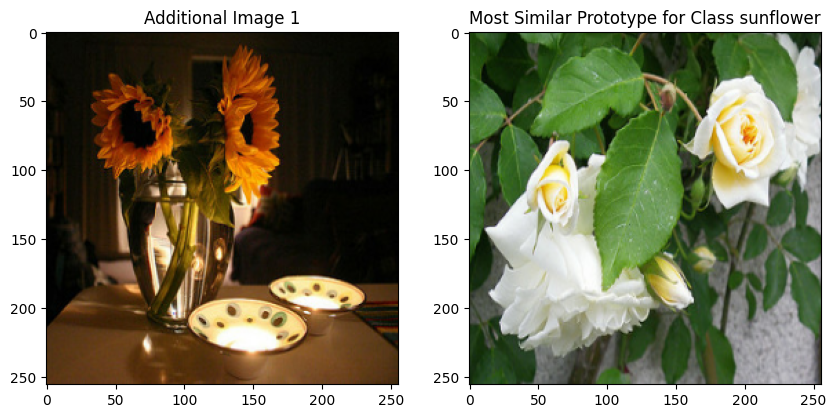

In [58]:
# Extract the embedding of the image
embedding_173 = extract_embeddings(cnn_model, X_test[173][np.newaxis, ...])[0]

# Find the most similar prototype
most_similar_prototype = match_prototypes(embedding_173, prototypes)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(X_test[173])
plt.title(f"Additional Image {i + 1}")
plt.subplot(1, 2, 2)
plt.imshow(X_test[np.argmin(np.linalg.norm(X_test_embed - most_similar_prototype, axis=1))])
plt.title(f"Most Similar Prototype for Class {class_name}")
plt.show()

